In [916]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
#permet davoir un rapport de notre base

# Importation base

In [917]:
data=pd.read_csv('BaseNettoye.csv',index_col=0)

In [918]:
data.shape
#data=data.reset_index(drop=True)

(1688, 12)

In [919]:
data.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog'],
      dtype='object')

In [920]:
data.head()

,PrimaryPropertyType,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,ENERGYSTARScore,Latitude,Longitude,PropertyGFATotalLog,SiteEnergyUse(kBtu)Log,TotalGHGEmissionsLog
0,HOTEL,DOWNTOWN,1927,1.0,12.0,0.0,62.5,47.612195,-122.337994,4.946619,6.851432,2.397427
1,HOTEL,DOWNTOWN,1996,1.0,11.0,15064.0,56.0,47.613138,-122.333644,5.015217,6.922781,2.445942
2,HOTEL,DOWNTOWN,1969,1.0,41.0,98359.0,30.5,47.613639,-122.337900,5.981839,7.862479,3.317088
3,HOTEL,DOWNTOWN,1926,1.0,10.0,0.0,28.5,47.614168,-122.336624,4.787602,7.141432,2.872000
4,HOTEL,DOWNTOWN,1980,1.0,18.0,37230.0,71.0,47.613752,-122.340697,5.161629,7.161282,2.704454


In [257]:
pandas_profiling.ProfileReport(data)
#overview une vue densemble de la base


Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [258]:
#pour enregistrer le rapport 
#pfr = pandas_profiling.ProfileReport(data)
#pfr.to_file("example.html")

In [921]:
data['PrimaryPropertyType'].value_counts(dropna=False) 

BUREAU         477
OTHER          256
Warehouse      217
BOUTIQUE       187
ECOLE          158
RESIDENCE      139
HOTEL           76
SOIN            72
CULTE           71
RESTAURANT      13
REWarehouse     12
Laboratoire     10
Name: PrimaryPropertyType, dtype: int64

In [922]:
data['Neighborhood'].value_counts(dropna=False)

DOWNTOWN    369
GREATER     347
EAST        300
MAGQUEE     154
LAKE        150
WEST        128
BALLARD      72
NORTH        67
CENTRAL      55
DELRIDGE     46
Name: Neighborhood, dtype: int64

In [923]:
data.isna().sum()

PrimaryPropertyType       0
Neighborhood              0
YearBuilt                 0
NumberofBuildings         0
NumberofFloors            0
PropertyGFAParking        0
ENERGYSTARScore           0
Latitude                  0
Longitude                 0
PropertyGFATotalLog       0
SiteEnergyUse(kBtu)Log    0
TotalGHGEmissionsLog      0
dtype: int64

In [924]:
data.shape

(1688, 12)

In [925]:
data.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog'],
      dtype='object')

In [926]:
data.select_dtypes('object').columns

Index(['PrimaryPropertyType', 'Neighborhood'], dtype='object')

# Encodage variables categorielles

In [927]:
data.select_dtypes('object').columns

Index(['PrimaryPropertyType', 'Neighborhood'], dtype='object')

In [928]:
data['PrimaryPropertyType'].unique()
#nous avons 12 modalites pour cette variables 

array(['HOTEL', 'OTHER', 'RESIDENCE', 'ECOLE', 'BUREAU', 'Warehouse',
       'SOIN', 'BOUTIQUE', 'CULTE', 'Laboratoire', 'REWarehouse',
       'RESTAURANT'], dtype=object)

In [929]:
data['Neighborhood'].unique()
#nous avons 10 modalités 

array(['DOWNTOWN', 'EAST', 'NORTH', 'LAKE', 'GREATER', 'MAGQUEE',
       'BALLARD', 'WEST', 'CENTRAL', 'DELRIDGE'], dtype=object)

In [930]:
data.shape

(1688, 12)

## Utlisation de get.dummies pour propertytype

In [931]:
dummy_df=pd.get_dummies(data['PrimaryPropertyType'])

In [932]:
dummy_df.head()

,BOUTIQUE,BUREAU,CULTE,ECOLE,HOTEL,Laboratoire,OTHER,RESIDENCE,RESTAURANT,REWarehouse,SOIN,Warehouse
0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0


In [933]:
dummy_df.isna().sum()

BOUTIQUE       0
BUREAU         0
CULTE          0
ECOLE          0
HOTEL          0
Laboratoire    0
OTHER          0
RESIDENCE      0
RESTAURANT     0
REWarehouse    0
SOIN           0
Warehouse      0
dtype: int64

In [934]:
dataFinal=pd.concat([data,dummy_df],axis=1)
dataFinal.shape,dummy_df.shape,data.shape

((1688, 24), (1688, 12), (1688, 12))

In [935]:
dataFinal.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL',
       'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse',
       'SOIN', 'Warehouse'],
      dtype='object')

## Encodage avec scikit learn onehot

In [936]:
data['Neighborhood'].unique() 
#nous avons 10 modalites pour notre colone neighborhood

array(['DOWNTOWN', 'EAST', 'NORTH', 'LAKE', 'GREATER', 'MAGQUEE',
       'BALLARD', 'WEST', 'CENTRAL', 'DELRIDGE'], dtype=object)

In [937]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

In [938]:
#https://pbpython.com/categorical-encoding.html
# toarray() pour convertir les résultats dans un format pouvant 
#être converti en DataFrame. 

In [939]:
from sklearn.preprocessing import OneHotEncoder

oe_style = OneHotEncoder()
oe_results = oe_style.fit_transform(data[["Neighborhood"]])
dataneigh=pd.DataFrame(oe_results.toarray(), columns=oe_style.categories_)

In [940]:
dataneigh.shape

(1688, 10)

In [941]:
dataneigh.head()

,BALLARD,CENTRAL,DELRIDGE,DOWNTOWN,EAST,GREATER,LAKE,MAGQUEE,NORTH,WEST
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [942]:
#dataneigh=dataneigh.astype('int')

In [943]:
dataneigh.isna().sum()

BALLARD     0
CENTRAL     0
DELRIDGE    0
DOWNTOWN    0
EAST        0
GREATER     0
LAKE        0
MAGQUEE     0
NORTH       0
WEST        0
dtype: int64

In [944]:
dataneigh.columns

MultiIndex([( 'BALLARD',),
            ( 'CENTRAL',),
            ('DELRIDGE',),
            ('DOWNTOWN',),
            (    'EAST',),
            ( 'GREATER',),
            (    'LAKE',),
            ( 'MAGQUEE',),
            (   'NORTH',),
            (    'WEST',)],
           )

In [945]:
def Colonne(b):
    l=len(b)
    c=[]
    for i in range(l):
        c.append(b[i][0])
    return c

In [946]:
dataneigh.columns=Colonne(dataneigh.columns)

In [947]:
dataneigh.columns

Index(['BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [948]:
dataModel=pd.concat([dataFinal,dataneigh],axis=1)

In [949]:
dataModel.shape

(1689, 34)

In [950]:
dataModel.isna().sum()

PrimaryPropertyType       1
Neighborhood              1
YearBuilt                 1
NumberofBuildings         1
NumberofFloors            1
PropertyGFAParking        1
ENERGYSTARScore           1
Latitude                  1
Longitude                 1
PropertyGFATotalLog       1
SiteEnergyUse(kBtu)Log    1
TotalGHGEmissionsLog      1
BOUTIQUE                  1
BUREAU                    1
CULTE                     1
ECOLE                     1
HOTEL                     1
Laboratoire               1
OTHER                     1
RESIDENCE                 1
RESTAURANT                1
REWarehouse               1
SOIN                      1
Warehouse                 1
BALLARD                   1
CENTRAL                   1
DELRIDGE                  1
DOWNTOWN                  1
EAST                      1
GREATER                   1
LAKE                      1
MAGQUEE                   1
NORTH                     1
WEST                      1
dtype: int64

In [951]:
dataModel=dataModel.dropna(axis='index')

In [952]:
dataModel.isna().sum()

PrimaryPropertyType       0
Neighborhood              0
YearBuilt                 0
NumberofBuildings         0
NumberofFloors            0
PropertyGFAParking        0
ENERGYSTARScore           0
Latitude                  0
Longitude                 0
PropertyGFATotalLog       0
SiteEnergyUse(kBtu)Log    0
TotalGHGEmissionsLog      0
BOUTIQUE                  0
BUREAU                    0
CULTE                     0
ECOLE                     0
HOTEL                     0
Laboratoire               0
OTHER                     0
RESIDENCE                 0
RESTAURANT                0
REWarehouse               0
SOIN                      0
Warehouse                 0
BALLARD                   0
CENTRAL                   0
DELRIDGE                  0
DOWNTOWN                  0
EAST                      0
GREATER                   0
LAKE                      0
MAGQUEE                   0
NORTH                     0
WEST                      0
dtype: int64

In [953]:
dataModel.shape,dataFinal.shape,data.shape

((1687, 34), (1688, 24), (1688, 12))

In [954]:
i=dataModel['BALLARD']==1
dataModel[i]
#quand c'est 1 ca veut dire que l ballard 0 c'est un autre 

,PrimaryPropertyType,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,ENERGYSTARScore,Latitude,Longitude,PropertyGFATotalLog,...,BALLARD,CENTRAL,DELRIDGE,DOWNTOWN,EAST,GREATER,LAKE,MAGQUEE,NORTH,WEST
36,BUREAU,BALLARD,1961.0,1.0,2.0,0.0,57.0,47.665840,-122.385396,4.977266,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91,SOIN,BALLARD,1954.0,2.5,5.0,0.0,21.0,47.667399,-122.379588,5.455352,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
92,ECOLE,BALLARD,1991.0,1.0,2.0,0.0,92.0,47.670458,-122.362255,4.744395,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
118,ECOLE,BALLARD,1999.0,1.0,2.0,0.0,81.0,47.676698,-122.374429,5.385240,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
125,ECOLE,BALLARD,1959.0,1.0,1.0,0.0,79.0,47.696896,-122.377853,5.204852,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1627,BUREAU,DOWNTOWN,2013.0,1.0,3.0,7494.5,69.5,47.596934,-122.312774,4.803544,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1644,SOIN,DOWNTOWN,1989.0,1.0,3.0,78000.0,72.0,47.608965,-122.342134,5.259416,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1674,OTHER,CENTRAL,2013.0,1.0,1.0,0.0,72.0,47.599050,-122.297870,4.067629,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1676,OTHER,NORTH,1949.0,1.0,1.0,0.0,72.0,47.721260,-122.297350,4.052502,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Prédiction de Siteenergyuse

In [955]:
dataModel.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL',
       'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse',
       'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN',
       'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

## Choix features

In [956]:
dataModel.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL',
       'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse',
       'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN',
       'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [957]:
features=['YearBuilt','NumberofBuildings', 'NumberofFloors', 'Latitude','Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking',
       'SiteEnergyUse(kBtu)Log','BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire',
       'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST']

In [958]:
index=dataModel.columns.isin(features)

In [959]:
dataSiteEN=dataModel[dataModel.columns[index]]

In [960]:
dataSiteEN.shape

(1687, 30)

In [961]:
dataSiteEN.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'Latitude', 'Longitude', 'PropertyGFATotalLog',
       'SiteEnergyUse(kBtu)Log', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE',
       'HOTEL', 'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT',
       'REWarehouse', 'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE',
       'DOWNTOWN', 'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [962]:
#fonction qui donne le taux de remplissage et nous dit les colonnes vides
#nous renseigne aussi le taux de remplissage 
#le taux de valeurs manquantes
def TraceValeurMissing(base):

  col_vides=[]
  for col in base.columns:
      if base[col].isnull().all():
        #all Renvoie True si au moins 
        #un élément de iterable est vrai. False est renvoyé dans 
        #le cas où iterable est vide
          col_vides.append(col)
  print ('les colonnes vides sont:\n\n')
  display(col_vides)#affiche tete de table
  t=pd.DataFrame(index=['number of missing values', 'number of values','fill_rate'], columns=base.columns )
  for col in base.columns:
      nb_nan=base[col].isnull().sum()
      t.loc['number of missing values',col]=nb_nan              
      t.loc['number of values', col]= base.shape[0]-nb_nan 
      t.loc['fill_rate', col]=(base.shape[0]-nb_nan)/(base.shape[0]*1.0)
      #taux de remplissage
  display(t)#pd.set
  dico = {'columns': base.columns, 'fill_rate': (t.loc['fill_rate', base.columns]*100), 'missing_values': (100-t.loc['fill_rate',base.columns]*100)}
  tr = pd.DataFrame(dico)
  tr=tr.sort_values(by='fill_rate', ascending=False)
  barWidth=0.85#largeur des barres
  plt.figure(figsize=(8,10))
  plt.gca().invert_yaxis()#pour creer des axes polaires valeur d'une graduation
  #taille des graduations
#plt.barh creation dune barre horizontale
  plt.barh(tr['columns'], tr['fill_rate'], color='#a3acff')
  plt.barh(tr['columns'], tr['missing_values'], left=tr['fill_rate'],color ='#b5ffb9')
  plt.title('Taux de remplissage', fontsize=30)
  plt.yticks(fontsize=10)
  plt.ylabel('columns', fontdict={'fontsize' : 20})
  plt.xlabel('fill rate(%)', fontdict={'fontsize' : 20})

  plt.axvline(x=80, color='b')
  plt.text(82, -1, '>80%', color='b')
  plt.axvline(x=20, color='r')
  plt.text(12, -1, '<20%', color='r')
  plt.axvline(x=50,color='g')
  plt.text(50,-1,'>50%',color='b')
  plt.grid(True)


les colonnes vides sont:




[]

,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,Latitude,Longitude,PropertyGFATotalLog,SiteEnergyUse(kBtu)Log,BOUTIQUE,BUREAU,...,BALLARD,CENTRAL,DELRIDGE,DOWNTOWN,EAST,GREATER,LAKE,MAGQUEE,NORTH,WEST
number of missing values,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
number of values,1687,1687,1687,1687,1687,1687,1687,1687,1687,1687,...,1687,1687,1687,1687,1687,1687,1687,1687,1687,1687
fill_rate,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


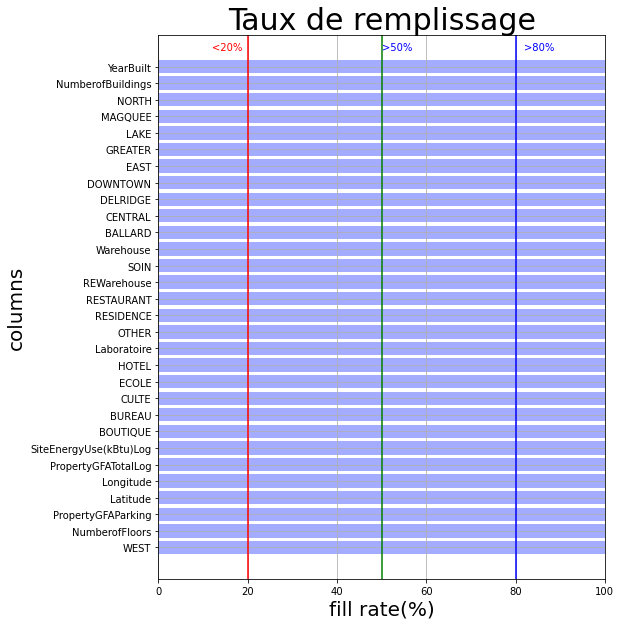

In [963]:
TraceValeurMissing(dataSiteEN)

In [964]:
dataSiteEN.shape

(1687, 30)

In [1248]:
X=dataSiteEN[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'Latitude', 'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE',
       'HOTEL', 'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT',
       'REWarehouse', 'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE',
       'DOWNTOWN', 'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST']]

In [1249]:
y=dataSiteEN['SiteEnergyUse(kBtu)Log']

In [1250]:
X.shape,y.shape

((1687, 29), (1687,))

In [968]:
X.isna().sum()

YearBuilt              0
NumberofBuildings      0
NumberofFloors         0
Latitude               0
Longitude              0
PropertyGFATotalLog    0
PropertyGFAParking     0
BOUTIQUE               0
BUREAU                 0
CULTE                  0
ECOLE                  0
HOTEL                  0
Laboratoire            0
OTHER                  0
RESIDENCE              0
RESTAURANT             0
REWarehouse            0
SOIN                   0
Warehouse              0
BALLARD                0
CENTRAL                0
DELRIDGE               0
DOWNTOWN               0
EAST                   0
GREATER                0
LAKE                   0
MAGQUEE                0
NORTH                  0
WEST                   0
dtype: int64

In [1023]:
#X[['DELRIDGE','CENTRAL','Laboratoire','RESTAURANT','REWarehouse']]
#les modalites qui apparaissent le moins 
#stratify= X[['DELRIDGE','CENTRAL','Laboratoire','RESTAURANT','REWarehouse']]
#avec stratify on pourra le mettre quand on a une  variable apparait le plus on pourra 
#le mettre pour le stratifier sur le train et le test 
#c'est a dire quil va etre dispatcher dans le train et test 
#

## Décomposition et standardisation

In [970]:
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
#standard scaler = x-moyenne /ecart type 
#est sensible aux outliers 
#c'est pourquoi nous avons faits une transformation en log 
# Robust scaler = x-mediane/ ecart interquartille


In [1251]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.20)

In [1252]:
std_scale=preprocessing.StandardScaler().fit(X_train)
#entrainement sur le train

In [1253]:
X_scale_train=std_scale.transform(X_train)
#transformation du train

In [1254]:
X_scale_test=std_scale.transform(X_test)
#transformation du test

In [1255]:
X_scale_train.shape,X_scale_test.shape

((1349, 29), (338, 29))

In [1256]:
X_scale_train.mean(),X_scale_test.mean()

(-1.2528171967969201e-14, 0.008032679213013804)

## Regression classique

In [1257]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold

In [1258]:
from sklearn import linear_model
#cv=KFold(5,shuffle=True,random_state=0)
lr=linear_model.LinearRegression()
score=cross_val_score(lr,X_scale_train,y_train,scoring='neg_mean_squared_error',cv=5)
print(abs(score))
print("%0.3f MSE with a standard deviation of %0.3f" % (abs(score).mean(), abs(score).std()))

[0.08961201 0.09041336 0.11423891 0.1118635  0.13248616]
0.108 MSE with a standard deviation of 0.016


In [1259]:
import timeit #pour mesurer le temps déxécution
from sklearn import linear_model
start_time=timeit.default_timer()
lr=linear_model.LinearRegression()
lr.fit(X_scale_train,y_train)

LinearRegression()

In [1438]:
# MSE permet de regarder le modele qui fait le plus d'erreur
#lr.predict
y_predi = lr.predict(X_scale_test)
MSELinear=mean_squared_error(y_test,y_predi)
print('Notre MSE est égal à %0.2f' %MSELinear)
#mae = mean_absolute_error(y_test, y_predi)
#print('MAE: %.3f' % mae)
mapeLinear= mean_absolute_percentage_error(y_test, y_predi) * 100
print('MAPE :' ,mapeLinear)
# Evaluation du training set

elapsedLineaire= timeit.default_timer()-start_time
print('Voici le temps de calcul',elapsedLineaire)   
rmseLinear = (np.sqrt(mean_squared_error(y_test, y_predi)))
r2linear= r2_score(y_test, y_predi)
#print('La performance du modèle sur la base dapprentissage')
#print('--------------------------------------')
print('RMSE est {}'.format(rmseLinear))
print('le score R2 coeff de determination et variation expliquée est %0.2f' %(r2linear))
#print('\n')
print('Train Score :', lr.score(X_scale_train,y_train))
print('Test Score :', lr.score(X_scale_test,y_test))

Notre MSE est égal à 0.10
MAPE : 3.8398662877156506
Voici le temps de calcul 3790.458730499995
RMSE est 0.3236566107878114
le score R2 coeff de determination et variation expliquée est 0.67
Train Score : 0.7039212355797284
Test Score : 0.6688665025607398


In [1261]:
MSELinear,r2linear

(0.10475360170665282, 0.6688665025607398)

In [1262]:
X.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [1263]:
X.shape,lr.coef_.shape,lr.intercept_

((1687, 29), (29,), 6.4764602920092535)

In [1264]:
print(lr.intercept_) # B0 (b)
print(lr.coef_)      # B1 (coefficient directeur)
print(lr._residues) # A étudier pour avoir tous les résidus. sinon on peut faire la différence entre Y et myreg.predict(X)
print('coef dir =',lr.coef_, 'ord orgine =', lr.intercept_)

6.4764602920092535
[ 4.50809429e-02  1.73151144e-02  1.53315020e-02  9.55778969e-03
  4.80666174e-03  4.34324998e-01 -5.47934386e-02 -8.08200598e+10
 -1.15391510e+11 -5.23934429e+10 -7.31598228e+10 -5.32181744e+10
 -1.95134579e+10 -9.08688814e+10 -6.95515559e+10 -2.38633373e+10
 -2.06894291e+10 -4.98203321e+10 -8.26147743e+10 -9.55382620e+10
 -8.01489865e+10 -8.01489865e+10 -1.92379545e+11 -1.72757767e+11
 -1.82297300e+11 -1.23819768e+11 -1.34637410e+11 -8.45184425e+10
 -1.19529042e+11]
[]
coef dir = [ 4.50809429e-02  1.73151144e-02  1.53315020e-02  9.55778969e-03
  4.80666174e-03  4.34324998e-01 -5.47934386e-02 -8.08200598e+10
 -1.15391510e+11 -5.23934429e+10 -7.31598228e+10 -5.32181744e+10
 -1.95134579e+10 -9.08688814e+10 -6.95515559e+10 -2.38633373e+10
 -2.06894291e+10 -4.98203321e+10 -8.26147743e+10 -9.55382620e+10
 -8.01489865e+10 -8.01489865e+10 -1.92379545e+11 -1.72757767e+11
 -1.82297300e+11 -1.23819768e+11 -1.34637410e+11 -8.45184425e+10
 -1.19529042e+11] ord orgine = 6.476460

In [1265]:
y_predi = lr.predict(X_scale_test) #prédiction 
erreur=y_predi-y_test #erreur de prédiction 

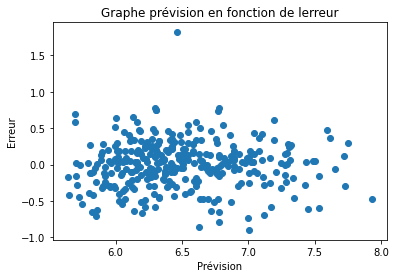

In [1266]:
plt.figure()
plt.scatter(y_predi,erreur)
plt.xlabel('Prévision')
plt.ylabel('Erreur')
plt.title('Graphe prévision en fonction de lerreur')
plt.show()

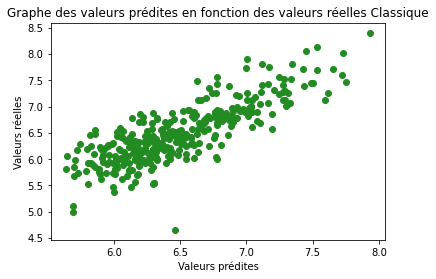

In [1267]:
plt.figure()
plt.scatter(y_predi,y_test,c='forestgreen')

plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Graphe des valeurs prédites en fonction des valeurs réelles Classique')
plt.show()

In [1268]:
#on va vérifier pourquoi nous avons trois propriétés qui se détachent 
#on va vérifier pkoi notre modéle a prévu 12 pour une propriété qui était
#à 8.94
i=data['SiteEnergyUse(kBtu)Log'] >= 8.5
sum(i)
data[i]
#c'est une école et une résidence 

,PrimaryPropertyType,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,ENERGYSTARScore,Latitude,Longitude,PropertyGFATotalLog,SiteEnergyUse(kBtu)Log,TotalGHGEmissionsLog
32,RESIDENCE,GREATER,1992,1.0,3.0,0.0,8.0,47.53493,-122.31788,5.694460,8.651651,4.227140
1648,ECOLE,EAST,1900,111.0,0.0,0.0,72.0,47.65644,-122.31041,6.969423,8.941474,4.046907


### Independance des erreurs

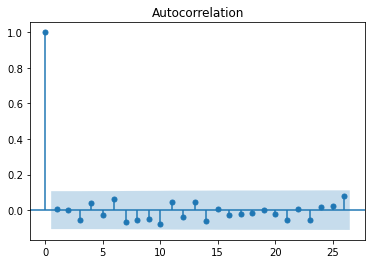

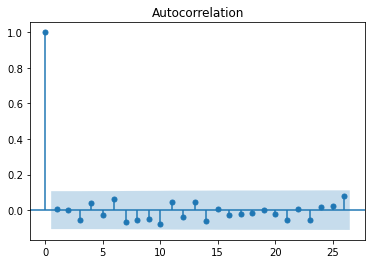

In [1269]:
#trace du graphe de la fonction d autocorrelation 
#C'est la corrélation croisée d'un signal par lui-même. 
#permet de detecter des regularites des profils repetes dans 
#un signal comme un signal périodique perturbé par beaucoup de bruit, 
#ou bien une fréquence fondamentale 
#d'un signal qui ne contient pas effectivement cette fondamentale
#http://perso.ens-lyon.fr/lise.vaudor/autocorrelation-de-series-temporelles-ou-spatiales/
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)
#https://sites.google.com/view/aide-python/statistiques/r%C3%A9gressions-lin%C3%A9aires-en-python

### Normalite des erreurs

In [1270]:
y=y_predi-y_test #c'est l'erreur
#test de normalite 
from scipy import stats
shapiro_test = stats.shapiro(y)

shapiro_test
#on pose H0 erreur normale
#H1 pas normale
#pvalue > 0.05 H0
#pvalue < 0.05 H1
#dapres le test l'erreur nest pas normale utilison le graphique 

ShapiroResult(statistic=0.9749874472618103, pvalue=1.3346181731321849e-05)

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

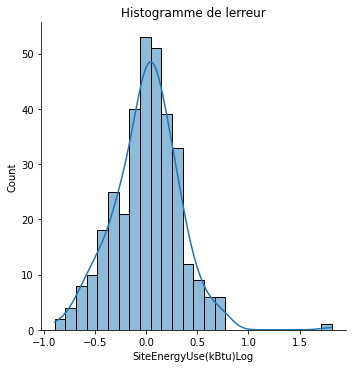

In [1271]:
plt.figure()
sns.displot(y_predi-y_test,kde=True)
plt.title('Histogramme de lerreur')

In [1272]:
y.mean(),y.var()
#a part notre individu qui est prevision a 12 
#nous avons une courbe symetrique avec une moyenne =0

(0.004883897421892162, 0.10504052002192095)

### Homogeneite des erreurs 

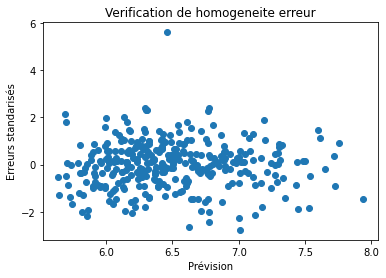

In [1273]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predi,y=erreur_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

In [1274]:
from statsmodels.stats.diagnostic import het_breuschpagan
het_breuschpagan(erreur,exog_het=X_scale_test,robust=True)
#exog_het Celui-ci contient des variables suspectées
#d'être liées à l'hétéroscédasticité chez le résid.
#m lagrange multiplier statistic
#lmpvalue valeur p du test du multiplicateur de lagrange 
#fvalue
#fpvalue
#pvalue < 0.05 on rejette lhomogeneite 
#ce resultat peut sexpliquer 

(35.0823746777118, 0.16748215122493523, 1.3340160777006318, 0.1283521094164718)

### Importance des variables

In [1275]:
df=pd.DataFrame({'var':X.columns,'coeff':lr.coef_})
df.sort_values('coeff')
#consomment beaucoup d'energie
#et ont beaucoup de poids dans la régression

,var,coeff
22,DOWNTOWN,-1.923795e+11
24,GREATER,-1.822973e+11
23,EAST,-1.727578e+11
26,MAGQUEE,-1.346374e+11
25,LAKE,-1.238198e+11
28,WEST,-1.195290e+11
8,BUREAU,-1.153915e+11
19,BALLARD,-9.553826e+10
13,OTHER,-9.086888e+10
27,NORTH,-8.451844e+10


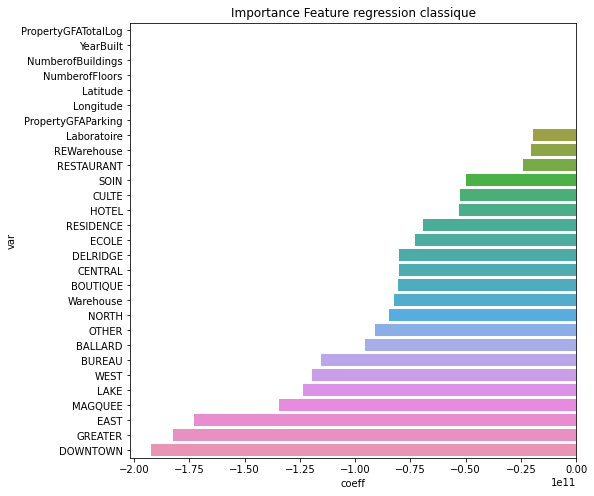

In [1276]:
plt.figure(figsize=(8,8))
plt.title('Importance Feature regression classique')
sns.barplot(y='var',x= 'coeff',data=df.sort_values('coeff',ascending=False))
plt.show()
#si l'importance de la variable est grande nous avons une forte consommation
#si l'importance de la variable est faible nous avons une faible consommation
#sil est nul nous avons une consommation normale 

In [1277]:
y_predi = lr.predict(X_scale_test)

In [1278]:
print(MSELinear,r2linear)

0.10475360170665282 0.6688665025607398


###  Comparaison avec approche naive 

#### Avec une regression aleatoire

In [1279]:
y_pred_random = np.random.randint(np.min(y_train), np.max(y_train), y_test.shape)
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_random)),'regression classique',MSELinear)

MSE : 2.72 regression classique 0.10475360170665282


#### Avec une constante 

In [1280]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='mean')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression classique',MSELinear)

MSE : 0.32 regression classique 0.10475360170665282


## Régression ridge 

In [1281]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import Ridge

### cross validation avec lambda=1.0

In [1282]:
#lambdas positif 
ridge=linear_model.Ridge(alpha=1.0)
ridge.fit(X_scale_train,y_train)

Ridge()

In [1283]:
#cv=KFold(5,shuffle=True,random_state=0)
score=cross_val_score(ridge,X_scale_train,y_train,scoring='neg_mean_squared_error',cv=5)
print(abs(score))
print("%0.3f MSE with a standard deviation of %0.3f" % (abs(score).mean(), abs(score).std()))

[0.08959972 0.09038595 0.11424266 0.11189553 0.13207626]
0.108 MSE with a standard deviation of 0.016


In [1284]:
# MSE permet de regarder le modele qui fait le plus d'erreur
#lr.predict
y_pred = ridge.predict(X_scale_test)
MSE=mean_squared_error(y_test,ridge.predict(X_scale_test))
print('Notre MSE est égal à', MSE)
#mae = mean_absolute_error(y_test, y_predi)
#print('MAE: %.3f' % mae)
#mape= mean_absolute_percentage_error(y_test, y_predi) * 100
#print('MAPE :' ,mape)
# Evaluation du training set

   
#rmse = (np.sqrt(mean_squared_error(y_test, y_predi)))
r2 = r2_score(y_test, y_predi)
#print('La performance du modèle sur la base dapprentissage')
#print('--------------------------------------')
#print('RMSE est {}'.format(rmse))
print('le score R2 coeff de determination et variation expliquée est {}'.format(r2))
#print('\n')
print('Train Score :', ridge.score(X_scale_train,y_train))
print('Test Score :', ridge.score(X_scale_test,y_test))

Notre MSE est égal à 0.10473963830145824
le score R2 coeff de determination et variation expliquée est 0.6688665025607398
Train Score : 0.7039213831297121
Test Score : 0.6689106418659561


#### Independance erreur

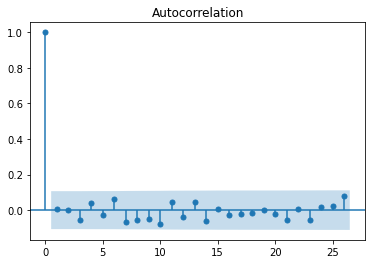

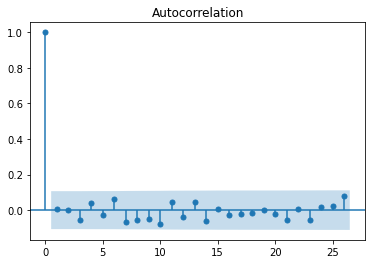

In [1285]:
from statsmodels.graphics.tsaplots import plot_acf
erreurrid= y_test-ridge.predict(X_scale_test)
plot_acf(erreurrid)
#https://sites.google.com/view/aide-python/statistiques/r%C3%A9gressions-lin%C3%A9aires-en-python

#### Normalite des erreurs 

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

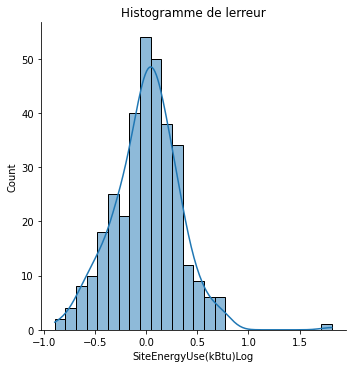

In [1286]:
y_pred = ridge.predict(X_scale_test)
y=y_pred-y_test
plt.figure()
sns.displot(y_pred-y_test,kde=True)
plt.title('Histogramme de lerreur')

#### Homegeneite

In [1287]:
from statsmodels.stats.diagnostic import het_breuschpagan
het_breuschpagan(erreurrid,exog_het=X_scale_test,robust=True)
#exog_het Celui-ci contient des variables suspectées
#d'être liées à l'hétéroscédasticité chez le résid.
#m lagrange multiplier statistic
#lmpvalue valeur p du test du multiplicateur de lagrange 
#fvalue
#fpvalue
#pvalue  > 0.05 on rejette lhomogeneite

(35.07154679578901, 0.1677942294446617, 1.333556676394665, 0.12862735759073027)

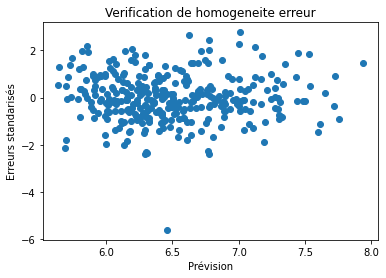

In [1375]:
erreurrid_std = erreurrid/erreurrid.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predi,y=erreurrid_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

#### Importance des features 

In [1289]:
#les coefficients de regulations
#avec la regression ridge les variables qui sont corrélées ont le meme poids
#peuvent etre proche de 0
df1=pd.DataFrame({'var':X.columns,'coeff':ridge.coef_})
df1.sort_values('coeff')

,var,coeff
18,Warehouse,-0.097017
6,PropertyGFAParking,-0.054461
9,CULTE,-0.047629
10,ECOLE,-0.028016
27,NORTH,-0.013785
24,GREATER,-0.011471
26,MAGQUEE,-0.010967
25,LAKE,-0.003730
8,BUREAU,-0.002310
20,CENTRAL,0.001141


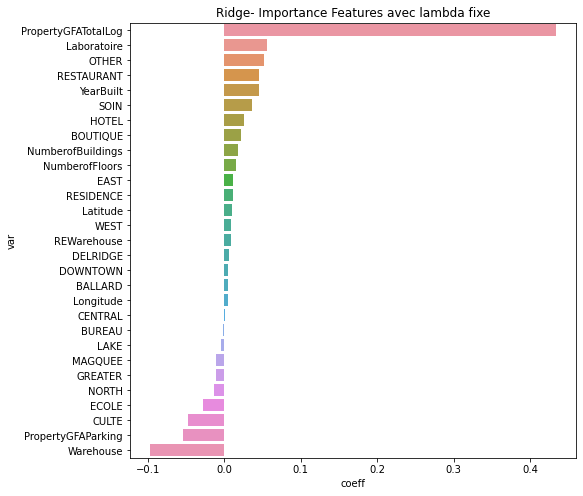

In [1290]:
plt.figure(figsize=(8,8))
plt.title('Ridge- Importance Features avec lambda fixe')
sns.barplot(y = 'var',
            x = 'coeff',data=df1.sort_values('coeff',ascending=False))
plt.show()
#si l'importance du coeficient est grande nous avons une forte consommation
#si l'importance du coefficient est faible nous avons une faible consommation
#sil est nul nous avons une consommation normale

### Cross validation pour le choix de alpha 

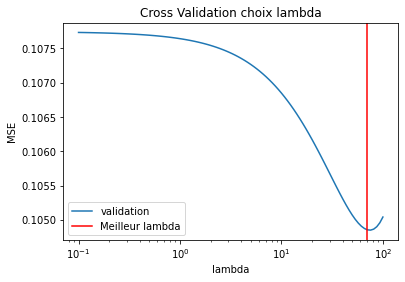

In [1360]:
from sklearn.model_selection import validation_curve
k=np.logspace(-1,2,100)
train_score,val_score=validation_curve(ridge,X_scale_train,y_train,param_name='alpha',param_range=k,scoring='neg_mean_squared_error',cv=5)
plt.figure()
plt.plot(k,-val_score.mean(axis=1),label='validation')
plt.axvline(x=alpha[val_score.mean(axis=1)==val_score.mean(axis=1).max()], color='r',label='Meilleur lambda')
#plt.plot(k,train_score.mean(axis=1),label='Train')
plt.xlabel('lambda')
plt.xscale('log')
plt.ylabel('MSE')
plt.title('Cross Validation choix lambda')
plt.legend()

In [1349]:
alpha[val_score.mean(axis=1)==val_score.mean(axis=1).max()]

array([68.92612104])

Text(0, 0.5, 'Score MSE')

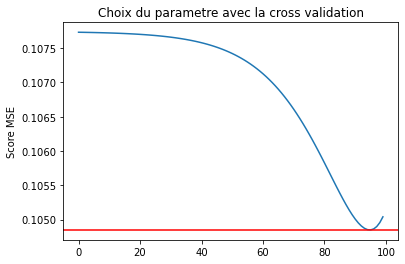

In [1293]:
val_score=[]
#cv=KFold(5,shuffle=True,random_state=1)
for k in np.logspace(-1,2,100):
    ridge=linear_model.Ridge(alpha=k)
    score=cross_val_score(ridge,X_scale_train,y_train,scoring='neg_mean_squared_error',cv=5)
   
    val_score.append(abs(score).mean())
    #print('MSE_train CrossValidation : %.3f' %abs(score))
plt.figure()
plt.plot(val_score)
plt.axhline(y=min(val_score), color='r',label='MSE faible')
plt.title('Choix du parametre avec la cross validation')
#plt.xlabel('Valeur de alpha')
plt.ylabel('Score MSE')

In [1294]:
#on a besoin d'un parametre lambda qui va controler le parametre 
#de regulation
lambdas=np.logspace(-1,2,100)
ridge=linear_model.Ridge()
#regression ridge
coeffs=[]
#coeff de régression des features
errorquadr=[]
#mse
for a in lambdas:
    ridge.set_params(alpha=a)
    ridge.fit(X_scale_train,y_train)
    coeffs.append(ridge.coef_)
    errorquadr.append(np.mean((ridge.predict(X_scale_test)-y_test)**2))

In [1295]:
MSELinear

0.10475360170665282

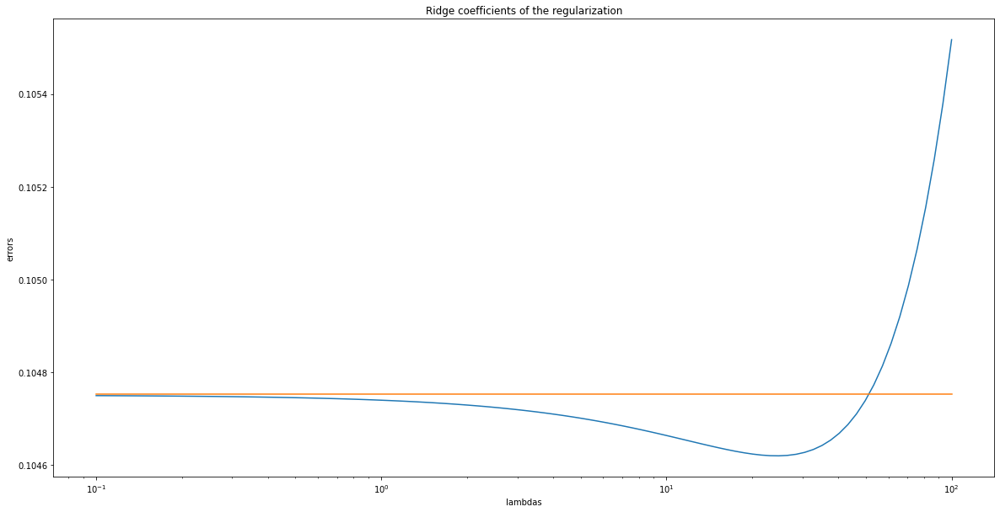

In [1296]:
#MSEerror est la mse de regression classique 
plt.figure(figsize=(20,10))
#fig,ax=plt.subplots() #creation des objets pour le oop
ax=plt.gca()
ax.plot(lambdas,errorquadr,[10**-1,10**2],[MSELinear,MSELinear])
ax.set_xscale('log')
plt.xlabel('lambdas')
plt.ylabel('errors')
plt.title('Ridge coefficients of the regularization')
plt.axis('tight')
plt.show()

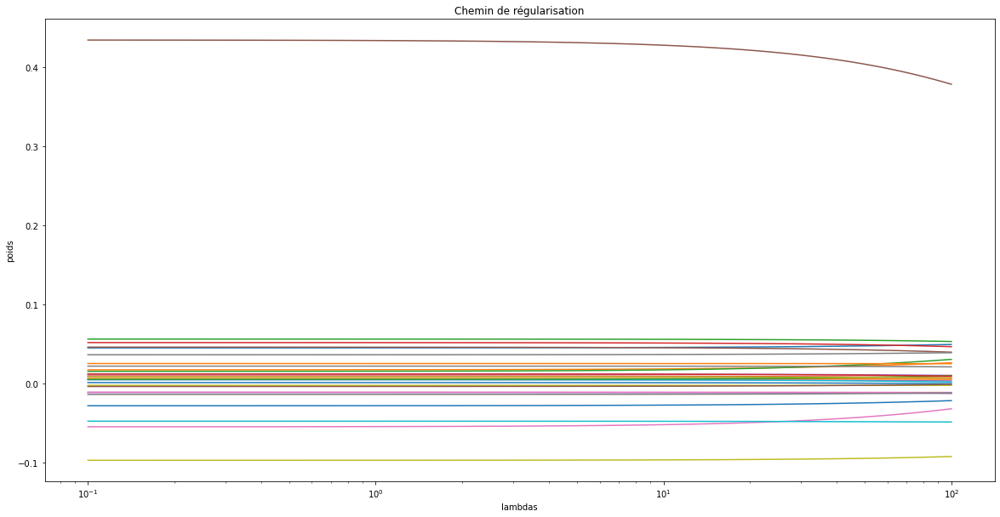

In [1297]:
plt.figure(figsize=(20,10))
ax=plt.gca()
ax.plot(lambdas,coeffs)
ax.set_xscale('log')
plt.xlabel('lambdas')
plt.ylabel('poids')
plt.axis('tight')
plt.title('Chemin de régularisation')
plt.show()

### RidgeCv

In [1298]:
from sklearn.linear_model import RidgeCV
#cv=KFold(5,shuffle=True,random_state=0)
model = RidgeCV(alphas=np.logspace(-1,2,100),cv=5, scoring='neg_mean_squared_error')
# fit model
model.fit(X_scale_train, y_train)
# summarize chosen configuration
print('alpha: %f' % model.alpha_)
model.best_score_

alpha: 75.646333


-0.10485017086365814

### GridSearchCv

In [1350]:
from sklearn.model_selection import GridSearchCV 
from sklearn.model_selection import validation_curve
model=linear_model.Ridge()
params = {'alpha': np.logspace(-1,2,100)}
grid=GridSearchCV(model,param_grid=params,cv=5,return_train_score=True)


In [1351]:
start_time = timeit.default_timer()
grid.fit(X_scale_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([  0.1       ,   0.10722672,   0.1149757 ,   0.12328467,
         0.13219411,   0.14174742,   0.15199111,   0.16297508,
         0.17475284,   0.18738174,   0.2009233 ,   0.21544347,
         0.23101297,   0.24770764,   0.26560878,   0.28480359,
         0.30538555,   0.32745492,   0.35111917,   0.37649358,
         0.40370173,   0.43287613,   0.46415888,   0.49770236,
         0.53366992,   0.57223677,   0.61359073...
        15.19911083,  16.29750835,  17.475284  ,  18.73817423,
        20.09233003,  21.5443469 ,  23.101297  ,  24.77076356,
        26.56087783,  28.48035868,  30.53855509,  32.74549163,
        35.11191734,  37.64935807,  40.37017259,  43.28761281,
        46.41588834,  49.77023564,  53.36699231,  57.22367659,
        61.35907273,  65.79332247,  70.54802311,  75.64633276,
        81.11308308,  86.97490026,  93.26033469, 100.        ])},
             return_train_score=True)

In [1361]:
#le meilleur parametre 
grid.best_params_

{'alpha': 75.64633275546291}

In [1362]:
#le meilleur estimateur
grid.best_estimator_

Ridge(alpha=75.64633275546291)

In [1363]:
grid.best_score_

0.677683708862889

In [1364]:
model_ridge=grid.best_estimator_
#c'est notre meilleur estimateur 

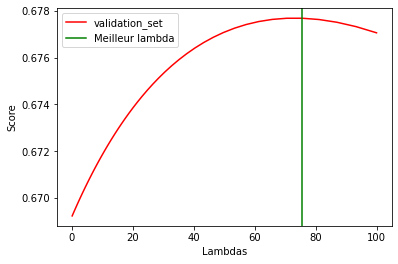

In [1365]:
plt.figure()
ax=plt.plot(lambdas,grid.cv_results_['mean_test_score'],color='red',label='validation_set')
#plt.plot(lambdas,grid.cv_results_['mean_train_score'],color='green',label='train')
plt.axvline(x=grid.best_params_['alpha'], color='green',label='Meilleur lambda')
plt.xlabel('Lambdas')
plt.ylabel('Score')
plt.legend()

### Choix modéle ridge 

In [1440]:
y_pred = model_ridge.predict(X_scale_test)
MSERidge=mean_squared_error(y_test,y_pred)
print('Notre MSE est égal à %0.2f' %MSE)
#mae = mean_absolute_error(y_test, y_pred)
#print('MAE: %.3f' % mae)
mapeRidge= mean_absolute_percentage_error(y_test,y_pred) * 100
elapsedRidge=timeit.default_timer()-start_time
print('Temps de calcul',elapsedRidge)
print('MAPE :' ,mapeRidge)
# Evaluation du training set

   
rmseRidge = (np.sqrt(mean_squared_error(y_test, y_pred)))
r2ridge = r2_score(y_test, y_pred)
#print('La performance du modèle sur la base dapprentissage')
#print('--------------------------------------')
print('RMSE est {}'.format(rmseRidge))
print('le score R2 coeff de determination et variation expliquée est %0.2f' %(r2ridge))
#print('\n')
print('Train Score :', model_ridge.score(X_scale_train,y_train))
print('Test Score :', model_ridge.score(X_scale_test,y_test))

Notre MSE est égal à 0.10
Temps de calcul 3852.8915228999977
MAPE : 3.8327005711806166
RMSE est 0.3241370256715916
le score R2 coeff de determination et variation expliquée est 0.67
Train Score : 0.7008116021416313
Test Score : 0.6678827468116921


#### Indépendance

In [1367]:
y_predr = model_ridge.predict(X_scale_test) #prédiction 
erreur=y_predr-y_test #erreur de prédiction 

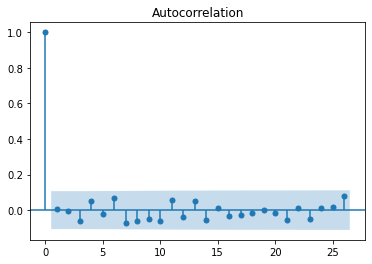

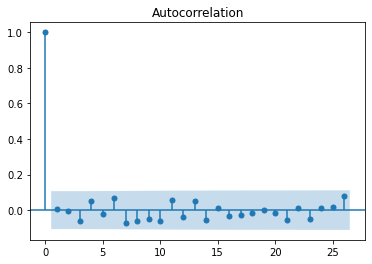

In [1368]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)

#### Normalité

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

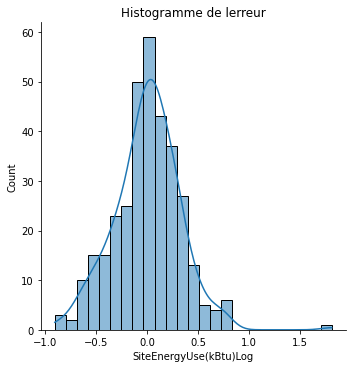

In [1369]:
plt.figure()
sns.displot(y_predr-y_test,kde=True)
plt.title('Histogramme de lerreur')

#### Homogénéité

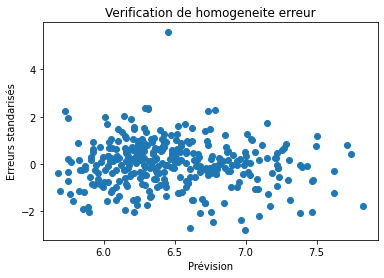

In [1370]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predr,y=erreur_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

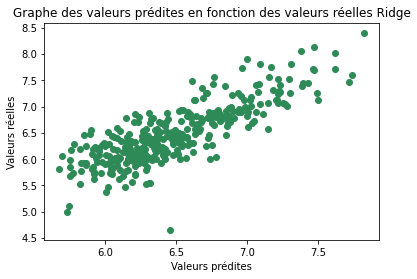

In [1371]:
plt.figure()
plt.scatter(y_predr,y_test,c='seagreen')
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Graphe des valeurs prédites en fonction des valeurs réelles Ridge')
plt.show()

#### Importance variables

In [1372]:
model_ridge.coef_
#les coefficient de regression de notre ridge

array([ 4.85576348e-02,  2.44895067e-02,  2.75376659e-02,  7.64852583e-03,
        3.58372448e-03,  3.90194423e-01, -3.67733737e-02,  2.13000353e-02,
       -2.37417205e-03, -4.85312992e-02, -2.29653288e-02,  2.50748402e-02,
        5.38515008e-02,  4.77141644e-02,  1.06062473e-02,  4.09628942e-02,
        6.71749380e-03,  3.84746839e-02, -9.34051279e-02,  2.46574505e-03,
        5.19467703e-05,  5.48789199e-03,  9.03954496e-03,  9.85391957e-03,
       -1.23438715e-02, -1.64160844e-03, -1.12806899e-02, -1.22393833e-02,
        7.41095521e-03])

In [1373]:
df2=pd.DataFrame({'var':X.columns,'coeff':model_ridge.coef_})
df2.sort_values('coeff')

,var,coeff
18,Warehouse,-0.093405
9,CULTE,-0.048531
6,PropertyGFAParking,-0.036773
10,ECOLE,-0.022965
24,GREATER,-0.012344
27,NORTH,-0.012239
26,MAGQUEE,-0.011281
8,BUREAU,-0.002374
25,LAKE,-0.001642
20,CENTRAL,0.000052


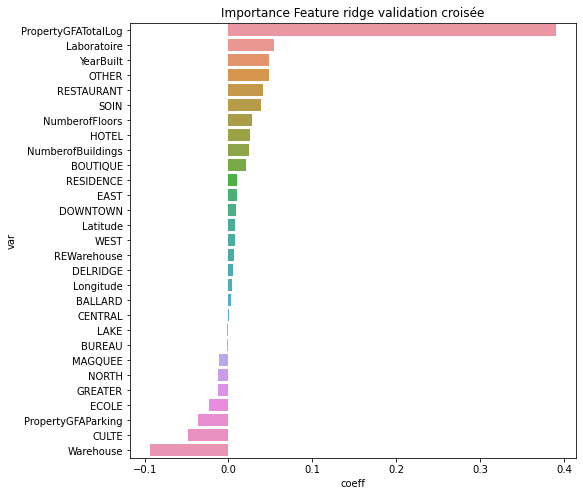

In [1374]:
plt.figure(figsize=(8,8))
plt.title('Importance Feature ridge validation croisée')
sns.barplot(y='var',x='coeff',data=df2.sort_values('coeff',ascending=False))
plt.show()

#### Comparaison approche naive 

In [1315]:
y_pred_random = np.random.randint(np.min(y_train), np.max(y_train), y_test.shape)
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_random)),'regression ridge',MSERidge)

MSE : 2.64 regression ridge 0.10506481141122602


In [1316]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='mean')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression ridge',MSERidge)

MSE : 0.32 regression ridge 0.10506481141122602


## Random forest (méthodes ensembliste)

In [1317]:
from sklearn.ensemble import RandomForestRegressor
#https://www.youtube.com/watch?v=-3UBmIXGHyc pour le chois des parametres 

### Cross Validation

Text(0, 0.5, 'Score MSE')

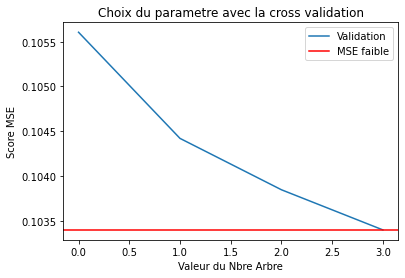

In [1318]:
val_score=[]
#cv=KFold(5,shuffle=True,random_state=0)
nbrarbres=[50,100,150,200]
for k in nbrarbres:
    randomForest=RandomForestRegressor(random_state=50,bootstrap=True,n_estimators=k)
    score=cross_val_score(randomForest,X_scale_train,y_train,scoring='neg_mean_squared_error',cv=5).mean()
    score=abs(score)
    val_score.append(score)
    #print('MSE_train CrossValidation : %.3f' %abs(score))
plt.figure()
plt.plot(val_score,label='Validation')
plt.axhline(y=min(val_score), color='r',label='MSE faible')
plt.title('Choix du parametre avec la cross validation')
plt.legend()
plt.xlabel('Valeur du Nbre Arbre')
plt.ylabel('Score MSE')

### Gridsearchcv validation croisée

In [1332]:
modelrf=RandomForestRegressor(bootstrap=True,random_state=50)
#random_state controle laleatoir present dans l'algo du modele 
#ca permet de fixer l'aleatoire donc sil ya une amelioration du modele dependra des hyperparametres 
#params = {'n_estimators':[50,100,150,200],'max_depth':[4,6,8,10],\
 #       'max_leaf_nodes':[20,25,35,40]}
params = {'n_estimators':[50,100,150,200]}
### Validation croisée
#criterium par defaut mse
#nestimators est le nombre darbre plus il ya  darbre plus le modele sera precis 
#maxdepth est la profondeur de larbre la longeur max de larbre on utilise des
#arbre peu profond en vue de gagner en performance a la fin plus larbre 
#sera profond plus il sera complexe plus il souffrira d overfitting
#valeur petite modele simple 
#maxleafnodes nombre de feuille maximum de larbre 
#plus il est grand plus il va tendre sur le surapprentissage 
#bootstrap true construction des arbre en selectionnant aleatoirement 
#diversite, independance, decentralisation
grid=GridSearchCV(modelrf,param_grid=params,cv=5,return_train_score=True)

In [1333]:
start_time=timeit.default_timer()
grid.fit(X_scale_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=50),
             param_grid={'n_estimators': [50, 100, 150, 200]},
             return_train_score=True)

In [1334]:
grid.best_params_

{'n_estimators': 200}

In [1335]:
grid.best_score_

0.682331205036861

In [1336]:
grid.cv_results_['mean_test_score'].shape

(4,)

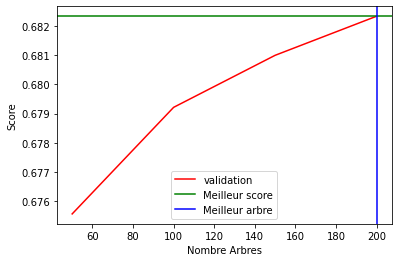

In [1342]:
plt.figure()
plt.plot(nbrarbres,grid.cv_results_['mean_test_score'],color='red',label='validation')
plt.axhline(y=grid.best_score_, color='green',label='Meilleur score')
plt.axvline(x=grid.best_params_['n_estimators'],color='blue',label='Meilleur arbre')
plt.xlabel('Nombre Arbres')
plt.ylabel('Score')
plt.legend()


In [1343]:
grid.best_estimator_

RandomForestRegressor(n_estimators=200, random_state=50)

In [1344]:
model_rf=grid.best_estimator_

In [1345]:
timeit.default_timer(),start_time

(33568.347226, 33475.4524351)

### Choix modélé random forest 

In [1441]:
ypred=model_rf.predict(X_scale_test)
MSERandom=mean_squared_error(y_test,ypred)
print('Notre MSE est égal à %0.2f' %MSERandom)
#mae = mean_absolute_error(y_test, ypred)
#print('MAE: %.3f' % mae)
mapeRandom= mean_absolute_percentage_error(y_test,ypred) * 100
print('MAPE :' ,mapeRandom)
elapsedRandom=timeit.default_timer()-start_time
# Evaluation du training set
print('temps de calcul',elapsedRandom)

   
rmseRandom = (np.sqrt(mean_squared_error(y_test, ypred)))
r2Random = r2_score(y_test, ypred)
print('La performance du modèle sur la base dapprentissage')
print('--------------------------------------')
print('RMSE est {}'.format(rmseRandom))
print('le score R2 coeff de determination et variation expliquée est%0.2f '%(r2Random))
#print('\n')
print('Train Score :', model_rf.score(X_scale_train,y_train))
print('Test Score :', model_rf.score(X_scale_test,y_test))

Notre MSE est égal à 0.10
MAPE : 3.797279510074346
temps de calcul 3924.9413552999977
La performance du modèle sur la base dapprentissage
--------------------------------------
RMSE est 0.32296855811785175
le score R2 coeff de determination et variation expliquée est0.67 
Train Score : 0.956581647725893
Test Score : 0.6702729012124906


In [1384]:
MSELinear,MSERidge

(0.10475360170665282, 0.10506481141122602)

#### Independance 

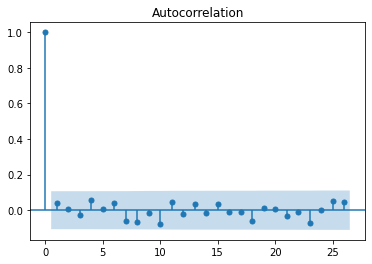

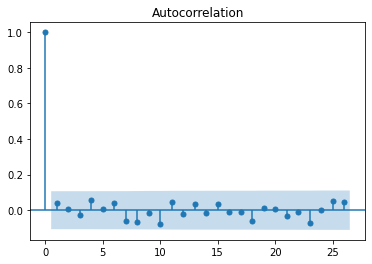

In [1376]:
y_predra = model_rf.predict(X_scale_test) #prédiction 
erreur=y_predra-y_test #erreur de prédiction 
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)

#### Normalite 

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

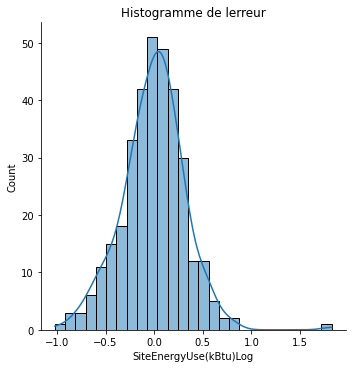

In [1377]:
plt.figure()
sns.displot(y_predra-y_test,kde=True)
plt.title('Histogramme de lerreur')

#### Homogénéité 

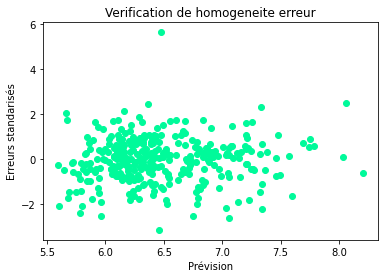

In [1378]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predra,y=erreur_std,c='mediumspringgreen')
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

#### Importance variables

In [1379]:
model_rf.feature_importances_

array([0.05470692, 0.00543187, 0.01907539, 0.05391809, 0.05266559,
       0.67792089, 0.00929032, 0.01008447, 0.00507923, 0.00589743,
       0.00444217, 0.00121929, 0.0068812 , 0.00971962, 0.00462274,
       0.00521749, 0.00140419, 0.00123576, 0.04231658, 0.00192326,
       0.00190218, 0.0019608 , 0.00307311, 0.00523746, 0.00460751,
       0.00209275, 0.00396482, 0.00146176, 0.00264712])

In [1382]:
df4=pd.DataFrame({'Features':X.columns,'Features_importances':model_rf.feature_importances_})
df4.sort_values('Features_importances')

,Features,Features_importances
11,HOTEL,0.001219
17,SOIN,0.001236
16,REWarehouse,0.001404
27,NORTH,0.001462
20,CENTRAL,0.001902
19,BALLARD,0.001923
21,DELRIDGE,0.001961
25,LAKE,0.002093
28,WEST,0.002647
22,DOWNTOWN,0.003073


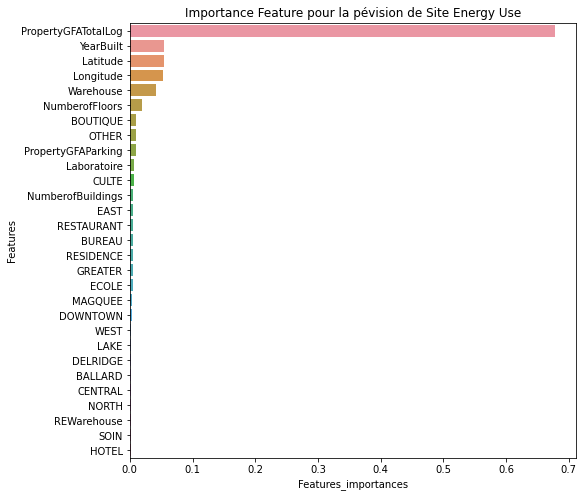

In [1381]:
plt.figure(figsize=(8,8))
plt.title('Importance Feature pour la pévision de Site Energy Use')
sns.barplot(y='Features',x='Features_importances',data=df4.sort_values('Features_importances',ascending=False))
plt.show()

#### Comparaison prédites et rélles 

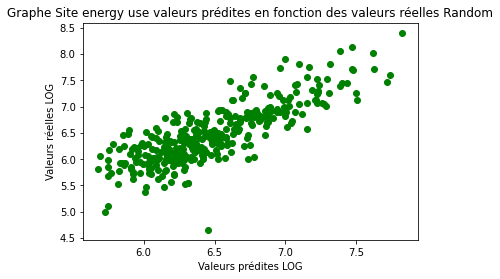

In [1383]:
plt.figure()
plt.scatter(y_pred,y_test,c='green')
plt.xlabel('Valeurs prédites LOG')
plt.ylabel('Valeurs réelles LOG')
plt.title('Graphe Site energy use valeurs prédites en fonction des valeurs réelles Random')
plt.show()

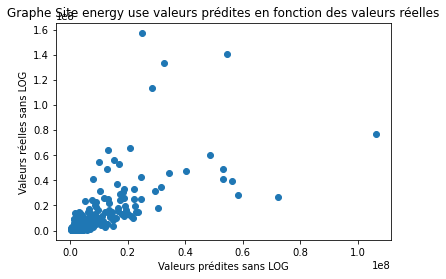

In [697]:
plt.figure()
plt.scatter(10**y_pred,10**y_test)
plt.xlabel('Valeurs prédites sans LOG')
plt.ylabel('Valeurs réelles sans LOG')
plt.title('Graphe Site energy use valeurs prédites en fonction des valeurs réelles')
plt.show()
#nous voyons que les valeurs réélles et prédites sont a peu prés la meme chose 
#il ya 3 propriétés qui ont des prévisions super importantes 

#### Comparaison approche naive 

In [698]:
y_pred_random = np.random.randint(np.min(y_train), np.max(y_train), y_test.shape)
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_random)),'regression random',MSERandom)

MSE : 2.52 regression random 0.11053340190985164


In [699]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='median')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression random',MSERandom)

MSE : 0.32 regression random 0.11053340190985164


## Perceptron multicouche MLP (non lineaire)

In [1385]:
from sklearn.neural_network import MLPRegressor
import warnings
import sklearn
warnings.filterwarnings("ignore", category=sklearn.exceptions.ConvergenceWarning)

### cross validation pour le choix d'un hyperparametre 

Text(0, 0.5, 'Score MSE')

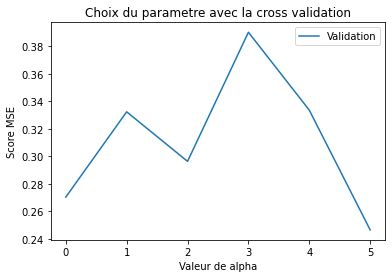

In [1412]:
val_score=[]
alphas=[0.0001,0.001,0.01,0.1,0.05,0.5]
#parametre de regulation
for k in alphas:
    MLP=MLPRegressor(alpha=k)
    score=cross_val_score(MLP,X_scale_train,y_train,scoring='neg_mean_squared_error',cv=5).mean()
    score=abs(score)
    val_score.append(score)
    #print('MSE_train CrossValidation : %.3f' %abs(score))
plt.figure()
plt.plot(val_score,label='Validation')
#plt.axhline(y=min(val_score), color='r',label='MSE faible')
plt.title('Choix du parametre avec la cross validation')
plt.legend()
#plt.xscale('log')
plt.xlabel('Valeur de alpha')
plt.ylabel('Score MSE')

### Gridsearchcv pour l'optimisation des hyper

In [1387]:
import warnings
import sklearn
warnings.filterwarnings("ignore", category=sklearn.exceptions.ConvergenceWarning)
MLP=MLPRegressor(solver='sgd')
params = {'hidden_layer_sizes':[(50,29),(100,29),(200,29)],'alpha':[0.0001,0.001,0.01,0.1,0.05],\
          'learning_rate_init':[0.0001,0.001,0.01,0.1,0.05,0.5],'activation':['tanh','logistic','identity']}
grid=GridSearchCV(MLP,param_grid=params,cv=5,return_train_score=True,scoring='neg_mean_squared_error')

#hidden layer le npmbre de neurones dans la couche cachee
#alpha parametre de regulation
#learning rate init controle la taille du pas 
#activation la fonction dactivation a utiliser tan hyperbolique, identity et la logistique
#solver on utilise la descente de gradiant 

In [1388]:
import warnings
import sklearn
warnings.filterwarnings("ignore", category=sklearn.exceptions.ConvergenceWarning)
start_time=timeit.default_timer()
grid.fit(X_scale_train,y_train)

C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\numpy\core\_methods.py:160: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), e

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\neural_network\_base.py:170: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\numpy\core\_methods.py:160: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator,

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\extmath.py:152: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 242, in _score
    return self._sign * self._score_func(y_true, y_pred,
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\soule\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 335, in mean_squared_error
    y_type, y_true, 

GridSearchCV(cv=5, estimator=MLPRegressor(solver='sgd'),
             param_grid={'activation': ['tanh', 'logistic', 'identity'],
                         'alpha': [0.0001, 0.001, 0.01, 0.1, 0.05],
                         'hidden_layer_sizes': [(50, 29), (100, 29), (200, 29)],
                         'learning_rate_init': [0.0001, 0.001, 0.01, 0.1, 0.05,
                                                0.5]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [1389]:
grid.best_params_

{'activation': 'logistic',
 'alpha': 0.01,
 'hidden_layer_sizes': (200, 29),
 'learning_rate_init': 0.05}

In [1390]:
grid.best_score_ #le score moyen 

-0.10036826547598557

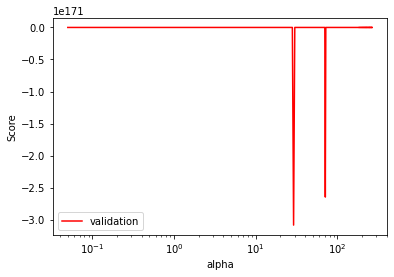

In [1410]:
plt.figure()
plt.plot(np.arange(0.05,270.05),grid.cv_results_['mean_test_score'],color='red',label='validation')
#plt.axhline(y=grid.best_score_, color='green',label='Meilleur score')
#plt.axvline(x=grid.best_params_['alpha'],color='blue',label='Meilleur alpha')
plt.xlabel('alpha')
plt.ylabel('Score')
plt.xscale('log')
plt.legend()


In [1414]:
10**-1

0.1

### Choix modéle MLP avec les meilleurs hyperparametres

In [1392]:
grid.best_params_

{'activation': 'logistic',
 'alpha': 0.01,
 'hidden_layer_sizes': (200, 29),
 'learning_rate_init': 0.05}

In [1415]:
model_mlp=grid.best_estimator_

In [1442]:
y_predm = model_mlp.predict(X_scale_test)
MSEMLP=mean_squared_error(y_test,y_predm)
print('Notre MSE est égal à %0.2f ' %MSEMLP)
#mae = mean_absolute_error(y_test, y_pred)
#print('MAE: %.3f' % mae)
mapeMLP= mean_absolute_percentage_error(y_test,y_predm) * 100
elapsedMLP=timeit.default_timer()-start_time
print('MAPE :' ,mapeMLP)
# Evaluation du training set
print('le temps dexecution est',elapsedMLP)

   
rmseMLP = (np.sqrt(mean_squared_error(y_test, y_predm)))
r2MLP = r2_score(y_test, y_predm)
#print('La performance du modèle sur la base dapprentissage')
#print('--------------------------------------')
print('RMSE est {}'.format(rmseMLP))
print('le score R2 coeff de determination et variation expliquée est %0.2f' %(r2MLP))
#print('\n')
print('Train Score :', model_mlp.score(X_scale_train,y_train))
print('Test Score :', model_mlp.score(X_scale_test,y_test))

Notre MSE est égal à 0.11 
MAPE : 3.7560205136786657
le temps dexecution est 4008.4073288
RMSE est 0.32406282903310224
le score R2 coeff de determination et variation expliquée est 0.67
Train Score : 0.7021406964529826
Test Score : 0.6680347761170835


### Independance

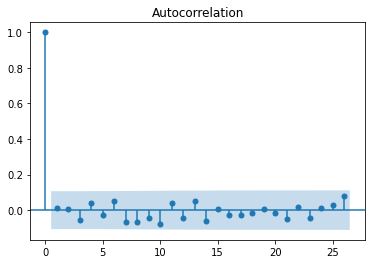

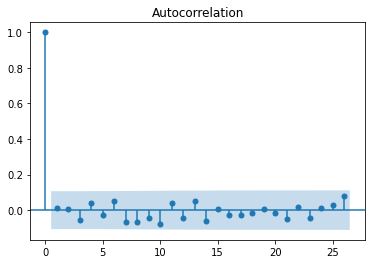

In [1417]:
y_predmlp = model_mlp.predict(X_scale_test) #prédiction 
erreur=y_predmlp-y_test #erreur de prédiction 
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)

### Normalite 

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

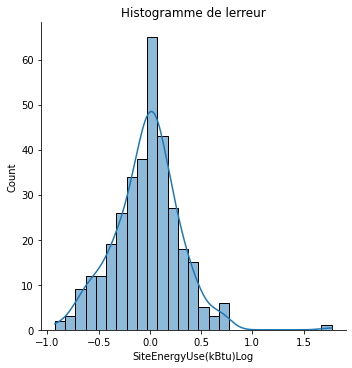

In [1418]:
plt.figure()
sns.displot(y_predmlp-y_test,kde=True)
plt.title('Histogramme de lerreur')

### Homogeneite 

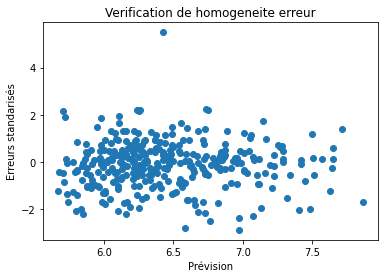

In [1419]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predmlp,y=erreur_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

### Comparaison naive

In [1398]:
y_pred_random = np.random.randint(np.min(y_train), np.max(y_train), y_test.shape)
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_random)),'regression random',MSEMLP)

MSE : 2.41 regression random 0.10501671716093765


In [1420]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='mean')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression MLP',MSEMLP)

MSE : 0.32 regression MLP 0.10501671716093765


### Comparaison prédites et rélles 

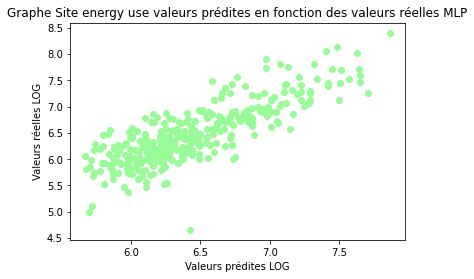

In [1400]:
plt.figure()
plt.scatter(y_predmlp,y_test,c='palegreen')
plt.xlabel('Valeurs prédites LOG')
plt.ylabel('Valeurs réelles LOG')
plt.title('Graphe Site energy use valeurs prédites en fonction des valeurs réelles MLP')
plt.show()

# Tableau des résultats 

In [1459]:
resultat=pd.DataFrame({'Modéle': ['RegréssionClassique', 'Ridge','Random Forest','MLP'],'MSE':[MSELinear,MSERidge,MSERandom,MSEMLP],'R2' :[r2linear,r2ridge,r2Random,r2MLP],\
                      'Hyper paramétre':[0,1,1,5],'MAPE (%)':[mapeLinear,mapeRidge,mapeRandom,mapeMLP],'RMSE':[rmseLinear,rmseRidge,rmseRandom,rmseMLP],'Tps éxécution (s)':\
                      [elapsedLineaire,elapsedRidge,elapsedRandom,elapsedMLP]})

In [1460]:
resultat

,Modéle,MSE,R2,Hyper paramétre,MAPE (%),RMSE,Tps éxécution (s)
0,RegréssionClassique,0.104754,0.668867,0,3.839866,0.323657,3790.458730
1,Ridge,0.105065,0.667883,1,3.832701,0.324137,3852.891523
2,Random Forest,0.104309,0.670273,1,3.797280,0.322969,3924.941355
3,MLP,0.105017,0.668035,5,3.756021,0.324063,4008.407329


In [1461]:
import dataframe_image as dfi
df_style=resultat.style.background_gradient()
df_style


,Modéle,MSE,R2,Hyper paramétre,MAPE (%),RMSE,Tps éxécution (s)
0,RegréssionClassique,0.104754,0.668867,0,3.839866,0.323657,3790.458730
1,Ridge,0.105065,0.667883,1,3.832701,0.324137,3852.891523
2,Random Forest,0.104309,0.670273,1,3.797280,0.322969,3924.941355
3,MLP,0.105017,0.668035,5,3.756021,0.324063,4008.407329


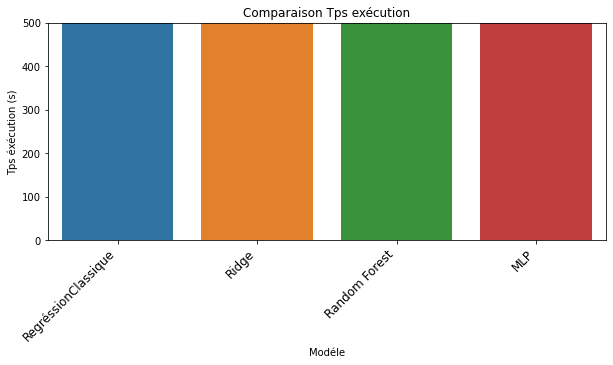

In [1462]:
plt.figure(figsize=(10,4))
plt.title('Comparaison Tps exécution')
chart = sns.barplot(x = resultat['Modéle'],
           y = resultat['Tps éxécution (s)'])

chart.set_xticklabels(labels = resultat['Modéle'], 
                      rotation=45,
                      horizontalalignment='right',
                        size=12,
                     )
ax = plt.gca()
ax.set_ylim([0, 500])
plt.show()

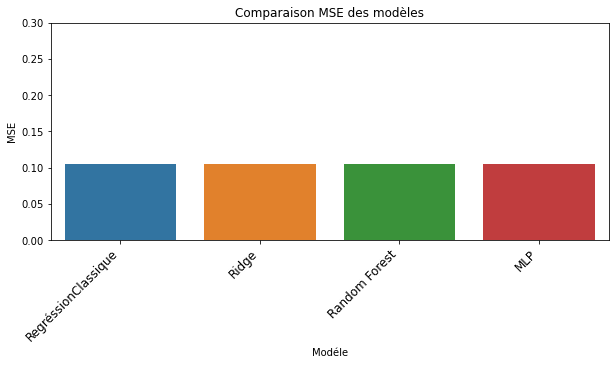

In [1463]:
plt.figure(figsize=(10,4))
plt.title('Comparaison MSE des modèles')
chart = sns.barplot(x = resultat['Modéle'],
           y = resultat['MSE'])

chart.set_xticklabels(labels = resultat['Modéle'], 
                      rotation=45,
                      horizontalalignment='right',
                        size=12,
                     )
ax = plt.gca()
ax.set_ylim([0, 0.3])
plt.show()

In [1464]:
resultat['MAE']=resultat['MAPE (%)']/100

In [1465]:
resultat

,Modéle,MSE,R2,Hyper paramétre,MAPE (%),RMSE,Tps éxécution (s),MAE
0,RegréssionClassique,0.104754,0.668867,0,3.839866,0.323657,3790.458730,0.038399
1,Ridge,0.105065,0.667883,1,3.832701,0.324137,3852.891523,0.038327
2,Random Forest,0.104309,0.670273,1,3.797280,0.322969,3924.941355,0.037973
3,MLP,0.105017,0.668035,5,3.756021,0.324063,4008.407329,0.037560


In [1466]:
comparaison_score_melt = pd.melt(resultat.reset_index(), id_vars = ['Modéle'], value_name = 'score', value_vars=['R2', 'MSE','MAE'])
#Annulez le pivotement d'un DataFrame du format large au format long, 
#en laissant éventuellement les identifiants définis. 

In [1467]:
comparaison_score_melt

,Modéle,variable,score
0,RegréssionClassique,R2,0.668867
1,Ridge,R2,0.667883
2,Random Forest,R2,0.670273
3,MLP,R2,0.668035
4,RegréssionClassique,MSE,0.104754
5,Ridge,MSE,0.105065
6,Random Forest,MSE,0.104309
7,MLP,MSE,0.105017
8,RegréssionClassique,MAE,0.038399
9,Ridge,MAE,0.038327


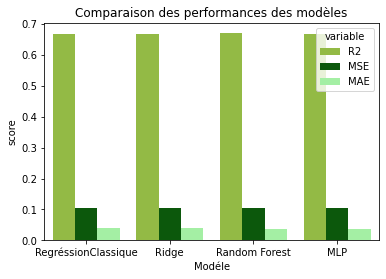

In [1468]:
plt.figure()
sns.barplot(x = comparaison_score_melt['Modéle'],
            y = comparaison_score_melt['score'], hue = comparaison_score_melt['variable'],palette=['yellowgreen','darkgreen','palegreen']);
plt.title('Comparaison des performances des modèles');



# Prédiction CO2 avec energystar

## Choix features

In [1469]:
dataModel.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'SiteEnergyUse(kBtu)Log',
       'TotalGHGEmissionsLog', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL',
       'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse',
       'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN',
       'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [1470]:
features=['YearBuilt', 'NumberofBuildings','NumberofFloors', 'ENERGYSTARScore', 'Latitude', 'Longitude',
       'PropertyGFATotalLog', 'PropertyGFAParking', 'TotalGHGEmissionsLog',
        'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire',
       'OTHER', 'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST']

In [1471]:
index=dataModel.columns.isin(features)
dataCO2EN=dataModel[dataModel.columns[index]]

In [1472]:
dataCO2EN.shape

(1687, 31)

In [1473]:
dataCO2EN.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'ENERGYSTARScore', 'Latitude', 'Longitude',
       'PropertyGFATotalLog', 'TotalGHGEmissionsLog', 'BOUTIQUE', 'BUREAU',
       'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER', 'RESIDENCE',
       'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL',
       'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH',
       'WEST'],
      dtype='object')

In [1474]:
Xco2=dataCO2EN[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'Latitude', 'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE', 'BUREAU', 'CULTE', 'ECOLE',
       'HOTEL', 'Laboratoire', 'OTHER', 'RESIDENCE', 'RESTAURANT',
       'REWarehouse', 'SOIN', 'Warehouse', 'BALLARD', 'CENTRAL', 'DELRIDGE',
       'DOWNTOWN', 'EAST', 'GREATER', 'LAKE', 'MAGQUEE', 'NORTH', 'WEST','ENERGYSTARScore']]

In [1475]:
yco2=dataCO2EN['TotalGHGEmissionsLog']

## Decomposition et standarisation

In [1476]:
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
#standard scaler = x-moyenne /ecart type 
#est sensible aux outliers 
#c'est pourquoi nous avons faits une transformation en log 
# Robust scaler = x-mediane/ ecart interquartille

In [1477]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(Xco2,yco2,test_size=0.30)

In [1478]:
std_scale=preprocessing.StandardScaler().fit(X_train)
#entrainement sur le train

In [1479]:
X_scale_train=std_scale.transform(X_train)
#transformation du train

In [1480]:
X_scale_test=std_scale.transform(X_test)
#entrainement du test 

## Grid search pour Random Forest 

In [1481]:
modelrf=RandomForestRegressor(bootstrap=True,random_state=50)
params = {'n_estimators':[50,100,150,200]}
          #'max_depth':[10,20,30],\
          #'max_leaf_nodes':[10,20,30]}
### Validation croisée
#nestimators est le nombre darbre plus il ya  darbre plus le modele sera precis 
#maxdepth est la profondeur de larbre la longeur max de larbre on utilise des
#arbre peu profond en vue de gagner en performance a la fin plus larbre 
#sera profond plus il sera complexe plus il souffrira d overfitting
#valeur petite modele simple 
#maxleafnodes nombre de feuille maximum de larbre 
#plus il est grand plus il va tendre sur le surapprentissage 
#bootstrap true construction des arbre en selectionnant aleatoirement 
#diversite, independance, decentralisation
grid=GridSearchCV(modelrf,param_grid=params,cv=5,return_train_score=True,scoring='neg_mean_squared_error')

In [1482]:
grid.fit(X_scale_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=50),
             param_grid={'n_estimators': [50, 100, 150, 200]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [1483]:
grid.best_estimator_

RandomForestRegressor(n_estimators=200, random_state=50)

In [1484]:
grid.best_score_

-0.20376758427464448

## Choix modéle

In [1485]:
rf=grid.best_estimator_

In [1486]:
# MSE permet de regarder le modele qui fait le plus d'erreur
#lr.predict
y_predCo2 = rf.predict(X_scale_test)
MSEEN=mean_squared_error(y_test,y_predCo2)
print('Notre MSE est égal à', MSEEN)
mae = mean_absolute_error(y_test, y_predCo2)
print('MAE: %.3f' % mae)
mapeEN= mean_absolute_percentage_error(y_test, y_predCo2) * 100
print('MAPE :' ,mapeEN)
# Evaluation du training set

   
rmseEN = (np.sqrt(mean_squared_error(y_test, y_predCo2)))
r2EN = r2_score(y_test, y_predCo2)
print('La performance du modèle sur la base dapprentissage')
print('--------------------------------------')
print('RMSE est {}'.format(rmseEN))
print('le score R2 coeff de determination et variation expliquée est {}'.format(r2EN))
print('\n')
print('Train Score :', rf.score(X_scale_train,y_train))
print('Test Score :', rf.score(X_scale_test,y_test))

Notre MSE est égal à 0.20751273573783177
MAE: 0.364
MAPE : 43.76965061546283
La performance du modèle sur la base dapprentissage
--------------------------------------
RMSE est 0.4555356580311049
le score R2 coeff de determination et variation expliquée est 0.5554696969245323


Train Score : 0.9324737112138901
Test Score : 0.5554696969245323


### Independance 

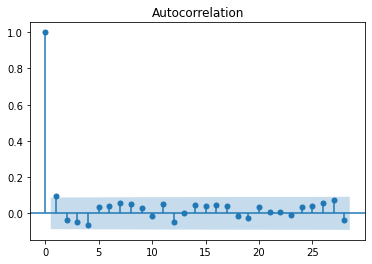

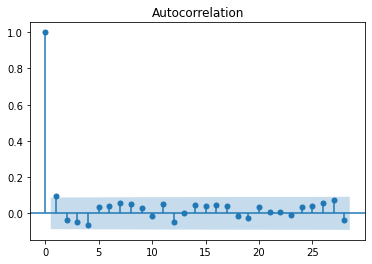

In [1487]:
erreur=y_predCo2-y_test #erreur de prédiction 
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)

### Normalite 

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

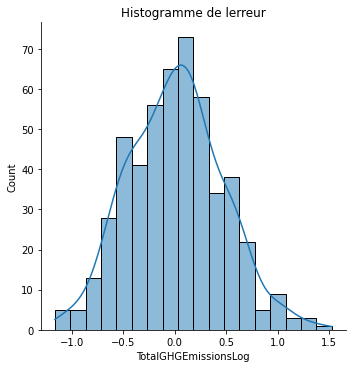

In [1488]:
plt.figure()
sns.displot(y_predCo2-y_test,kde=True)
plt.title('Histogramme de lerreur')

### Homogeneite 

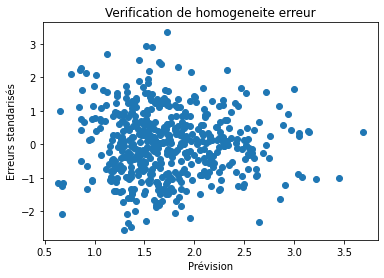

In [1489]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_predCo2,y=erreur_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

### Comparaison réelle et prevision

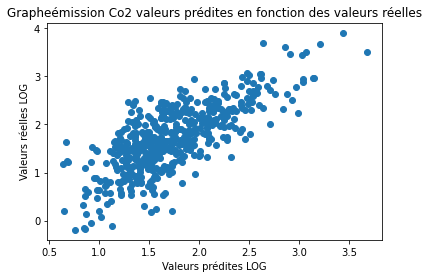

In [1490]:
plt.figure()
#sns.lineplot(x = [1.0], y = [1.0], alpha=1)
plt.scatter(y_predCo2,y_test)
plt.xlabel('Valeurs prédites LOG')
plt.ylabel('Valeurs réelles LOG')
plt.title('Grapheémission Co2 valeurs prédites en fonction des valeurs réelles')
plt.show()

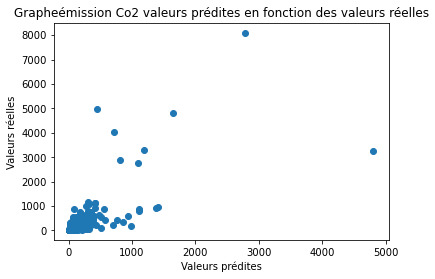

In [1491]:
plt.figure()
plt.scatter(10**y_predCo2,10**y_test)
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Grapheémission Co2 valeurs prédites en fonction des valeurs réelles')
plt.show()

### Comparaison naive 

In [1492]:
y_pred_random = np.random.randint(np.min(y_train), np.max(y_train), y_test.shape)
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_random)),'regression Forest',MSEEN)

MSE : 1.65 regression Forest 0.20751273573783177


In [1496]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='mean')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression Forest',MSEEN)

MSE : 0.47 regression Forest 0.20751273573783177


### Importance features

In [1497]:
d=pd.DataFrame({'var':Xco2.columns,'feature':rf.feature_importances_})
d.sort_values('feature')

,var,feature
16,REWarehouse,0.000491
21,DELRIDGE,0.001125
20,CENTRAL,0.001415
9,CULTE,0.001708
19,BALLARD,0.001988
28,WEST,0.002148
27,NORTH,0.002296
17,SOIN,0.002436
15,RESTAURANT,0.002890
25,LAKE,0.003083


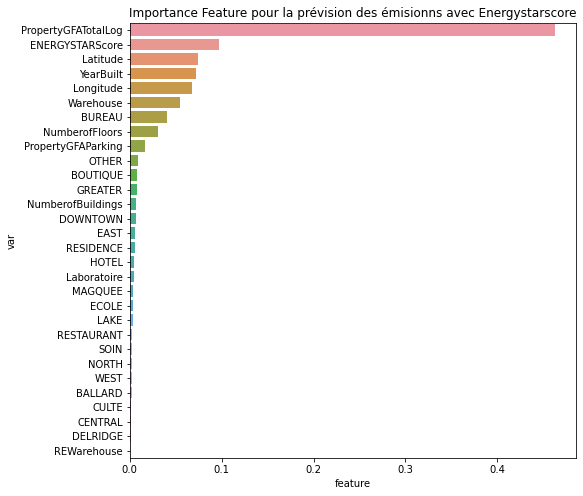

In [1498]:
plt.figure(figsize=(8,8))
plt.title('Importance Feature pour la prévision des émisionns avec Energystarscore')
sns.barplot(y='var',x='feature',data=d.sort_values('feature',ascending=False))
plt.show()

# Prediction CO2 sans energystrar

## Choix features

In [1499]:
X_train.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST', 'ENERGYSTARScore'],
      dtype='object')

In [1500]:
X_test.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST', 'ENERGYSTARScore'],
      dtype='object')

In [1501]:
X_test=X_test.drop(columns=['ENERGYSTARScore'])
#on prend le train et le test on enleve le  energystarscore 

In [1502]:
X_test.columns #verification 

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [1503]:
X_train=X_train.drop(columns=['ENERGYSTARScore'])

In [1504]:
X_train.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

### Standarisation

In [1505]:
X_train.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
       'Longitude', 'PropertyGFATotalLog', 'PropertyGFAParking', 'BOUTIQUE',
       'BUREAU', 'CULTE', 'ECOLE', 'HOTEL', 'Laboratoire', 'OTHER',
       'RESIDENCE', 'RESTAURANT', 'REWarehouse', 'SOIN', 'Warehouse',
       'BALLARD', 'CENTRAL', 'DELRIDGE', 'DOWNTOWN', 'EAST', 'GREATER', 'LAKE',
       'MAGQUEE', 'NORTH', 'WEST'],
      dtype='object')

In [1506]:
std_scale=preprocessing.StandardScaler().fit(X_train)

In [1507]:
X_scale_train=std_scale.transform(X_train)

In [1508]:
X_scale_test=std_scale.transform(X_test)

In [1512]:
grid.best_estimator_

RandomForestRegressor(n_estimators=200, random_state=50)

In [1513]:
RandomForestRegressor( n_estimators=200,
                      random_state=50)

RandomForestRegressor(n_estimators=200, random_state=50)

In [1514]:
rf

RandomForestRegressor(n_estimators=200, random_state=50)

### Modélisation random forest 

In [1515]:
rf2=rf.fit(X_scale_train,y_train)

In [1516]:
# MSE permet de regarder le modele qui fait le plus d'erreur
#lr.predict
y_predi = rf2.predict(X_scale_test)
MSESN=mean_squared_error(y_test,y_predi)
print('Notre MSE est égal à', MSESN)
mae = mean_absolute_error(y_test, y_predi)
print('MAE: %.3f' % mae)
mapeSN= mean_absolute_percentage_error(y_test, y_predi) * 100
print('MAPE :' ,mapeSN)
# Evaluation du training set

   
rmseSN = (np.sqrt(mean_squared_error(y_test, y_predi)))
r2SN = r2_score(y_test, y_predi)
print('La performance du modèle sur la base dapprentissage')
print('--------------------------------------')
print('RMSE est {}'.format(rmseSN))
print('le score R2 coeff de determination et variation expliquée est {}'.format(r2SN))
print('\n')
print('Train Score :', rf2.score(X_scale_train,y_train))
print('Test Score :', rf2.score(X_scale_test,y_test))

Notre MSE est égal à 0.22461795315461303
MAE: 0.373
MAPE : 46.794819421406885
La performance du modèle sur la base dapprentissage
--------------------------------------
RMSE est 0.4739387651950545
le score R2 coeff de determination et variation expliquée est 0.5188271869821062


Train Score : 0.9263161242885325
Test Score : 0.5188271869821062


#### Independance

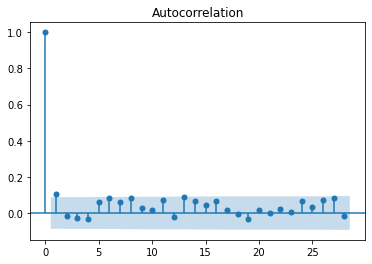

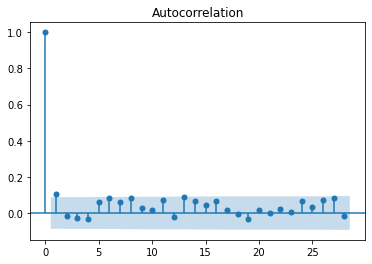

In [1517]:
y_pred = rf2.predict(X_scale_test) #prédiction 
erreur=y_pred-y_test #erreur de prédiction 
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(erreur)

#### Normalite 

Text(0.5, 1.0, 'Histogramme de lerreur')

<Figure size 432x288 with 0 Axes>

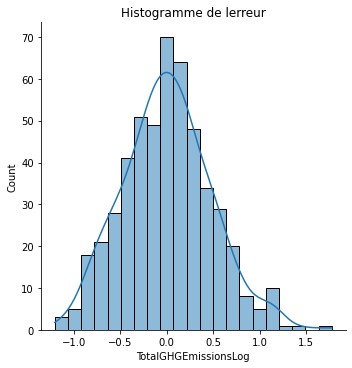

In [1518]:
plt.figure()
sns.displot(y_pred-y_test,kde=True)
plt.title('Histogramme de lerreur')

#### Homogeneite 

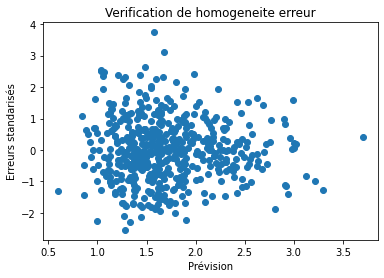

In [1519]:
erreur_std = erreur/erreur.std()
#on normalise notre erreur en divisant par son ecart type
plt.scatter(x=y_pred,y=erreur_std)
plt.xlabel('Prévision')
plt.ylabel('Erreurs standarisés')
plt.title('Verification de homogeneite erreur')
plt.show()
#on remarque que les erreurs sont assez regroupés entre eux et quon a 
#pas une sorte dentonnoir des erreurs qui se dispersent a part un element 

#### Comparaision relle et predites 

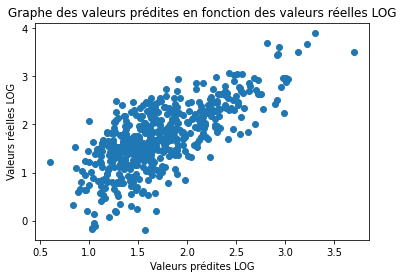

In [1520]:
plt.figure()
plt.scatter(y_pred,y_test)
plt.xlabel('Valeurs prédites LOG')
plt.ylabel('Valeurs réelles LOG')
plt.title('Graphe des valeurs prédites en fonction des valeurs réelles LOG')
plt.show()

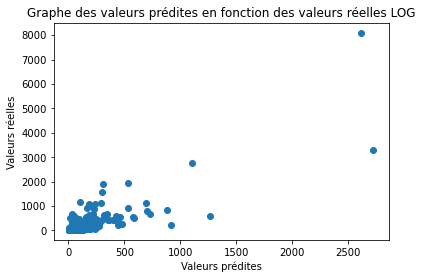

In [773]:
plt.figure()
plt.scatter(10**y_pred,10**y_test)
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Graphe des valeurs prédites en fonction des valeurs réelles LOG')
plt.show()

#### Comparaison naive 

In [1521]:
from sklearn import dummy
dum = dummy.DummyRegressor(strategy='mean')
#nous pouvons choisir la mediane ou une constante 
# Entraînement
dum.fit(X_scale_train, y_train)
# Prédiction sur le jeu de test
y_pred_dum = dum.predict(X_scale_test)
# Evaluation 
print("MSE : {:.2f}".format(mean_squared_error(y_test, y_pred_dum)),'regression Forest',MSESN)

MSE : 0.47 regression Forest 0.22461795315461303


#### Importance features

In [1522]:
d2=pd.DataFrame({'var':X_train.columns,'feature':rf2.feature_importances_})
d2.sort_values('feature')

,var,feature
16,REWarehouse,0.001103
21,DELRIDGE,0.001383
20,CENTRAL,0.001574
9,CULTE,0.002285
28,WEST,0.002478
19,BALLARD,0.002506
25,LAKE,0.003208
17,SOIN,0.003426
27,NORTH,0.003454
15,RESTAURANT,0.003752


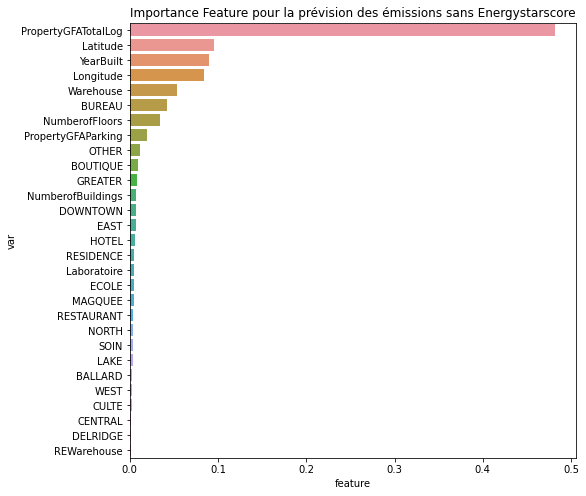

In [1523]:
plt.figure(figsize=(8,8))
plt.title('Importance Feature pour la prévision des émissions sans Energystarscore')
sns.barplot(y='var',x='feature',data=d2.sort_values('feature',ascending=False))
plt.show()

# Comparaison sans ENS et avec ENS

In [1531]:
compar=pd.DataFrame({'Prévision':['Avec EnergyStarScore','Sans EnergyStarScore'],'MSE':[MSEEN,MSESN],'MAPE':[mapeEN,mapeSN],\
                    'R2':[r2EN,r2SN],'RMSE':[rmseEN,rmseSN]})

In [1532]:
compar['MAE']=compar['MAPE']/100

In [1533]:
compar

,Prévision,MSE,MAPE,R2,RMSE,MAE
0,Avec EnergyStarScore,0.207513,43.769651,0.555470,0.455536,0.437697
1,Sans EnergyStarScore,0.224618,46.794819,0.518827,0.473939,0.467948


In [1534]:
resultat

,Modéle,MSE,R2,Hyper paramétre,MAPE (%),RMSE,Tps éxécution (s),MAE
0,RegréssionClassique,0.104754,0.668867,0,3.839866,0.323657,3790.458730,0.038399
1,Ridge,0.105065,0.667883,1,3.832701,0.324137,3852.891523,0.038327
2,Random Forest,0.104309,0.670273,1,3.797280,0.322969,3924.941355,0.037973
3,MLP,0.105017,0.668035,5,3.756021,0.324063,4008.407329,0.037560


In [1535]:
comparaison = pd.melt(compar.reset_index(), id_vars = ['Prévision'], value_name = 'score', value_vars=['R2', 'MSE','MAE'])

In [1536]:
comparaison

,Prévision,variable,score
0,Avec EnergyStarScore,R2,0.555470
1,Sans EnergyStarScore,R2,0.518827
2,Avec EnergyStarScore,MSE,0.207513
3,Sans EnergyStarScore,MSE,0.224618
4,Avec EnergyStarScore,MAE,0.437697
5,Sans EnergyStarScore,MAE,0.467948


Text(0.5, 1.0, 'Comparaison des performances des modèles')

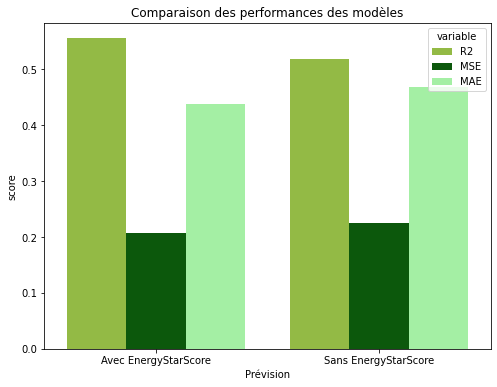

In [1537]:
plt.figure(figsize=(8,6))
sns.barplot(x = comparaison['Prévision'],
            y = comparaison['score'], hue = comparaison['variable'],palette=['yellowgreen','darkgreen','palegreen'])
plt.title('Comparaison des performances des modèles')

# Courbe d'apprentissage 

In [1538]:
rf2

RandomForestRegressor(n_estimators=200, random_state=50)

In [1539]:
from sklearn.model_selection import learning_curve

In [1540]:
np.linspace(0.20,1.0,5)
#ce sont des pourcentages de données par exemple si mon data set contient 100
#on aura 20 point dans le 1 lot, 40 point, 60 point 80 point et 100 points dans 
#le dernier lot 

array([0.2, 0.4, 0.6, 0.8, 1. ])

In [1541]:
X_scale_train.shape

(1180, 29)

In [1542]:
N,train_score,val_score=learning_curve(rf2,X_scale_train,y_train,train_sizes=np.linspace(0.1,1.0,10),cv=5)

In [789]:
print(N)

[ 94 188 283 377 472 566 660 755 849 944]


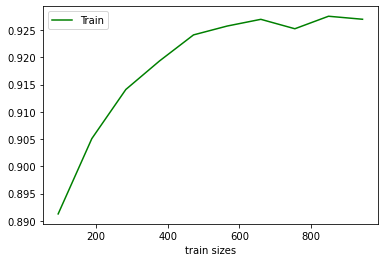

In [794]:
plt.figure()
#plt.subplot(1,2,1)
plt.plot(N,train_score.mean(axis=1),color='green',label='Train')
plt.xlabel('train sizes')
plt.legend()
#plt.subplot(1,2,2)
#plt.plot(N,val_score.mean(axis=1),label='Test')
#plt.xlabel('train sizes')
plt.legend()